In [1]:
#Import Libraries
import pandas as pd
import os
from openbb_terminal.sdk import openbb
from dotenv import load_dotenv
from datetime import datetime
import plotly.express as px
import numpy as np
from pathlib import Path
from MCForecastTools import MCSimulation
import alpaca_trade_api as tradeapi

%matplotlib inline

Python-dotenv could not parse statement starting at line 7
Python-dotenv could not parse statement starting at line 7


In [2]:
#Load PAT and access openBB
load_dotenv()
obb_pat = os.getenv("OBB_PAT")

openbb.login(token = obb_pat)


Creating session from token.

Token expires at 2024-12-03 18:34:20

Login successful.

# Pre-COVID January 1, 2015 to December 31, 2019

In [3]:
#import ticker data for precovid timeline
JPM_precovid = openbb.stocks.load('JPM', start_date='2015-01-01', end_date='2019-12-31')
AAPL_precovid = openbb.stocks.load('AAPL', start_date='2015-01-01', end_date='2019-12-31')
KO_precovid = openbb.stocks.load('KO', start_date='2015-01-01', end_date='2019-12-31')
DIS_precovid = openbb.stocks.load('DIS', start_date='2015-01-01', end_date='2019-12-31')
ACN_precovid = openbb.stocks.load('ACN', start_date='2015-01-01', end_date='2019-12-31')

#extract adjusted close for each ticker
JPM_precovid = JPM_precovid['Adj Close']
AAPL_precovid = AAPL_precovid['Adj Close']
KO_precovid = KO_precovid['Adj Close']
DIS_precovid = DIS_precovid['Adj Close']
ACN_precovid = ACN_precovid['Adj Close']

#create list of stock names
stock_names = ['JPM', 'AAPL', 'KO', 'DIS', 'ACN']

#combine dataframes and rename columns
stocks_precovid = pd.concat([JPM_precovid, AAPL_precovid, KO_precovid, DIS_precovid, ACN_precovid], axis=1, join='inner')
stocks_precovid = stocks_precovid.set_axis(stock_names, axis=1)
stocks_precovid

Loading Daily data for JPM with starting period 2015-01-02.

Loading Daily data for AAPL with starting period 2015-01-02.

Loading Daily data for KO with starting period 2015-01-02.

Loading Daily data for DIS with starting period 2015-01-02.

Loading Daily data for ACN with starting period 2015-01-02.

,JPM,AAPL,KO,DIS,ACN
date,,,,,
2015-01-02,48.849258,24.466452,31.598589,87.092430,76.523407
2015-01-05,47.332726,23.777189,31.598589,85.819702,75.231369
2015-01-06,46.105427,23.779436,31.838543,85.364502,74.688713
2015-01-07,46.175789,24.112869,32.235962,86.237747,76.256409
2015-01-08,47.207649,25.039339,32.625881,87.129570,77.419220
...,...,...,...,...,...
2019-12-24,121.910164,69.236221,48.285961,144.818024,199.780884
2019-12-26,123.203865,70.609894,48.559563,145.226685,200.196350
2019-12-27,123.292488,70.583099,48.850811,145.276535,200.356827


In [4]:
# Display the highest and lowest prices for each stock
print(f"JPM High of ${round(JPM_precovid.max(), 2)} on {stocks_precovid.idxmax().loc['JPM'].strftime('%b %d %Y')} --- JPM Low of ${round(JPM_precovid.min(), 2)} on {stocks_precovid.idxmin().loc['JPM'].strftime('%b %d %Y')}") 
print(f"AAPL High of ${round(AAPL_precovid.max(), 2)} on {stocks_precovid.idxmax().loc['AAPL'].strftime('%b %d %Y')} --- AAPL Low of ${round(AAPL_precovid.min(), 2)} on {stocks_precovid.idxmin().loc['AAPL'].strftime('%b %d %Y')}") 
print(f"KO High of ${round(KO_precovid.max(), 2)} on {stocks_precovid.idxmax().loc['KO'].strftime('%b %d %Y')} --- KO Low of ${round(KO_precovid.min(), 2)} on {stocks_precovid.idxmin().loc['KO'].strftime('%b %d %Y')}") 
print(f"DIS High of ${round(DIS_precovid.max(), 2)} on {stocks_precovid.idxmax().loc['DIS'].strftime('%b %d %Y')} --- DIS Low of ${round(DIS_precovid.min(), 2)} on {stocks_precovid.idxmin().loc['DIS'].strftime('%b %d %Y')}") 
print(f"ACN High of ${round(ACN_precovid.max(), 2)} on {stocks_precovid.idxmax().loc['ACN'].strftime('%b %d %Y')} --- ACN Low of ${round(ACN_precovid.min(), 2)} on {stocks_precovid.idxmin().loc['ACN'].strftime('%b %d %Y')}") 


JPM High of $123.52 on Dec 31 2019 --- JPM Low of $42.51 on Jan 30 2015
AAPL High of $71.52 on Dec 31 2019 --- AAPL Low of $20.8 on May 12 2016
KO High of $48.85 on Dec 27 2019 --- KO Low of $28.96 on Aug 25 2015
DIS High of $150.25 on Nov 26 2019 --- DIS Low of $83.55 on Feb 10 2016
ACN High of $200.36 on Dec 27 2019 --- ACN Low of $72.38 on Jan 30 2015


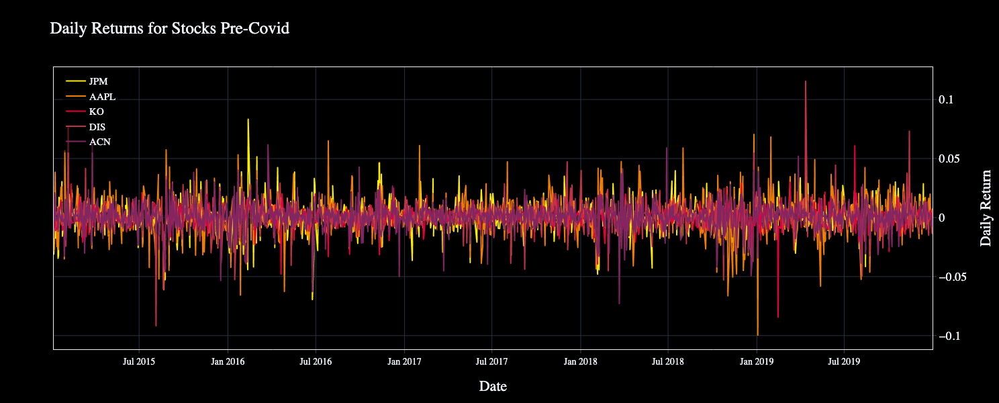

In [5]:
# Calculate daily returns Pre-Covid
stocks_precovid_returns = stocks_precovid.pct_change()
stocks_precovid_returns.dropna(inplace=True)

#Plot of Precovid Daily Returns
px.line(stocks_precovid_returns, 
        labels={'variable' : '', 'value' : 'Daily Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Daily Returns for Stocks Pre-Covid')

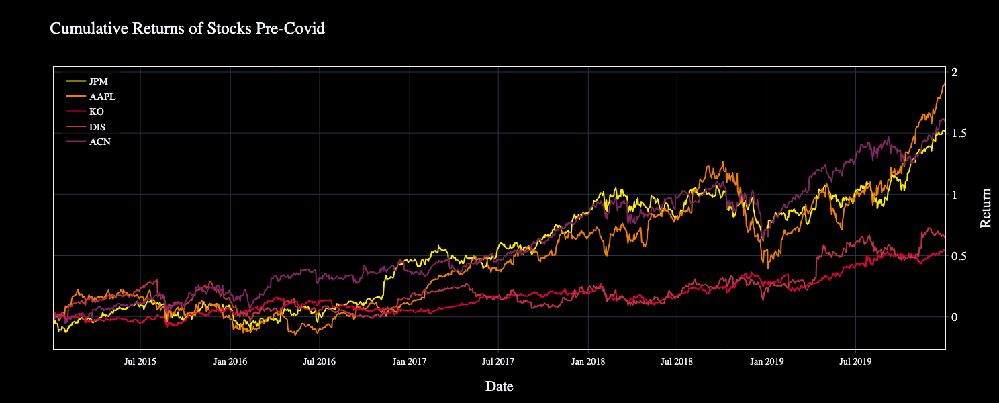

In [6]:
# Calculate and Plot cumulative returns of stocks
stocks_precovid_cum_returns = (1 + stocks_precovid_returns).cumprod() - 1

px.line(stocks_precovid_cum_returns, 
        labels={'variable' : '', 'value' : 'Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Cumulative Returns of Stocks Pre-Covid')

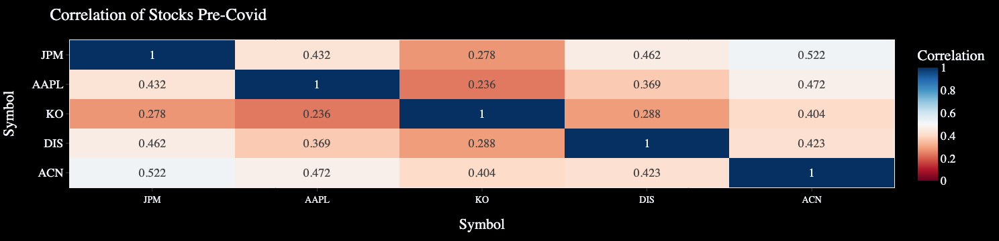

In [7]:
#Calculate and Plot Correlation of stocks  pre-covid
stocks_precovid_corr = round(stocks_precovid_returns.corr(), 3)

px.imshow(stocks_precovid_corr, text_auto=True, aspect="auto", color_continuous_scale='RdBu', range_color=[0,1],
         labels={'x':'Symbol', 'y':'Symbol','color':'Correlation'}).update_yaxes(side="left").update_layout(title_text='Correlation of Stocks Pre-Covid')


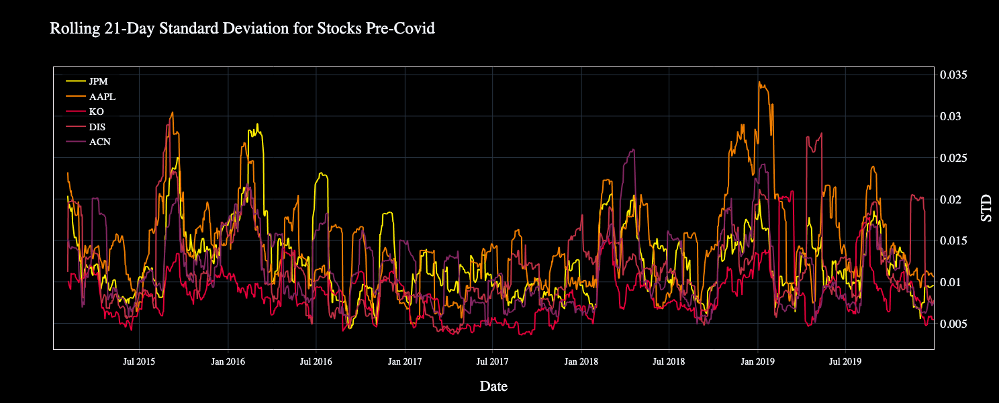

In [8]:
#Calculate Covid Standard Deviation
stocks_precovid_std = stocks_precovid_returns.std()*np.sqrt(252)

# Calculate Rolling standard deviation for stocks using a 21-day window
stocks_precovid_roll_std = stocks_precovid_returns.rolling(window=21).std()

#Plot the rolling standard deviation
px.line(stocks_precovid_roll_std,
        height=600, width=1000,
        labels={'variable' : '', 'value' : 'STD', 'date' : 'Date'},
        title='Rolling 21-Day Standard Deviation for Stocks Pre-Covid')

# COVID January 1, 2020 to December 31, 2021

In [9]:
#import ticker data for Covid timeline
JPM_covid = openbb.stocks.load('JPM', start_date='2020-01-01', end_date='2021-12-31')
AAPL_covid = openbb.stocks.load('AAPL', start_date='2020-01-01', end_date='2021-12-31')
KO_covid = openbb.stocks.load('KO', start_date='2020-01-01', end_date='2021-12-31')
DIS_covid = openbb.stocks.load('DIS', start_date='2020-01-01', end_date='2021-12-31')
ACN_covid = openbb.stocks.load('ACN', start_date='2020-01-01', end_date='2021-12-31')

#extract adjusted close for each ticker
JPM_covid = JPM_covid['Adj Close']
AAPL_covid = AAPL_covid['Adj Close']
KO_covid = KO_covid['Adj Close']
DIS_covid = DIS_covid['Adj Close']
ACN_covid = ACN_covid['Adj Close']

#combine dataframes and rename columns
stocks_covid = pd.concat([JPM_covid, AAPL_covid, KO_covid, DIS_covid, ACN_covid], axis=1, join='inner')
stocks_covid = stocks_covid.set_axis(stock_names, axis=1)

Loading Daily data for JPM with starting period 2020-01-02.

Loading Daily data for AAPL with starting period 2020-01-02.

Loading Daily data for KO with starting period 2020-01-02.

Loading Daily data for DIS with starting period 2020-01-02.

Loading Daily data for ACN with starting period 2020-01-02.

In [10]:
# Display the highest and lowest prices for each stock
print(f"JPM High of ${round(JPM_covid.max(), 2)} on {stocks_covid.idxmax().loc['JPM'].strftime('%b %d %Y')} --- JPM Low of ${round(JPM_covid.min(), 2)} on {stocks_covid.idxmin().loc['JPM'].strftime('%b %d %Y')}") 
print(f"AAPL High of ${round(AAPL_covid.max(), 2)} on {stocks_covid.idxmax().loc['AAPL'].strftime('%b %d %Y')} --- AAPL Low of ${round(AAPL_covid.min(), 2)} on {stocks_covid.idxmin().loc['AAPL'].strftime('%b %d %Y')}") 
print(f"KO High of ${round(KO_covid.max(), 2)} on {stocks_covid.idxmax().loc['KO'].strftime('%b %d %Y')} --- KO Low of ${round(KO_covid.min(), 2)} on {stocks_covid.idxmin().loc['KO'].strftime('%b %d %Y')}") 
print(f"DIS High of ${round(DIS_covid.max(), 2)} on {stocks_covid.idxmax().loc['DIS'].strftime('%b %d %Y')} --- DIS Low of ${round(DIS_covid.min(), 2)} on {stocks_covid.idxmin().loc['DIS'].strftime('%b %d %Y')}") 
print(f"ACN High of ${round(ACN_covid.max(), 2)} on {stocks_covid.idxmax().loc['ACN'].strftime('%b %d %Y')} --- ACN Low of ${round(ACN_covid.min(), 2)} on {stocks_covid.idxmin().loc['ACN'].strftime('%b %d %Y')}") 


JPM High of $161.7 on Oct 22 2021 --- JPM Low of $70.48 on Mar 23 2020
AAPL High of $178.29 on Dec 27 2021 --- AAPL Low of $54.78 on Mar 23 2020
KO High of $55.75 on Dec 31 2021 --- KO Low of $33.44 on Mar 23 2020
DIS High of $201.25 on Mar 08 2021 --- DIS Low of $85.48 on Mar 23 2020
ACN High of $403.42 on Dec 29 2021 --- ACN Low of $136.18 on Mar 23 2020


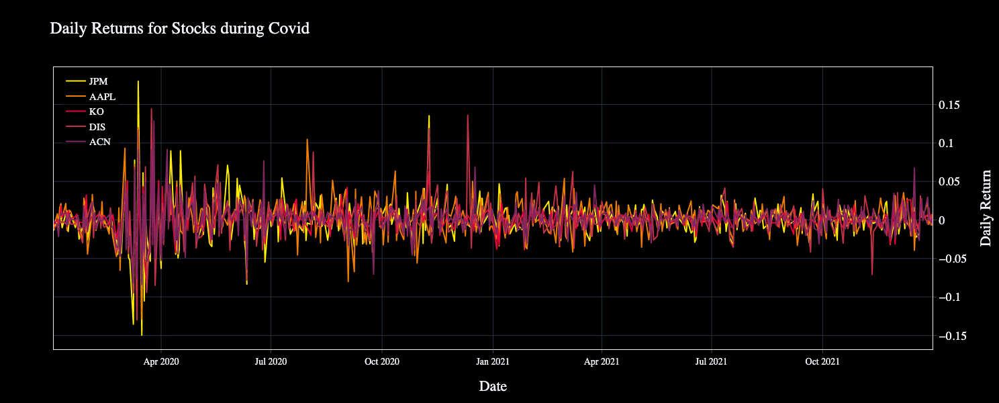

In [11]:
# Calculate daily returns during Covid
stocks_covid_returns = stocks_covid.pct_change()
stocks_covid_returns.dropna(inplace=True)

#Plot of during` Daily Returns
px.line(stocks_covid_returns, 
        labels={'variable' : '', 'value' : 'Daily Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Daily Returns for Stocks during Covid')

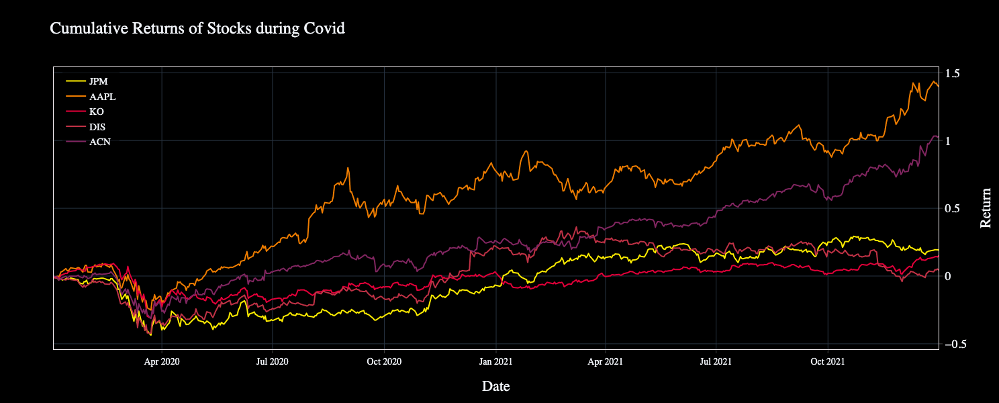

In [12]:
# Calculate and Plot cumulative returns of stocks during covid
stocks_covid_cum_returns = (1 + stocks_covid_returns).cumprod() - 1

px.line(stocks_covid_cum_returns, 
        labels={'variable' : '', 'value' : 'Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Cumulative Returns of Stocks during Covid')


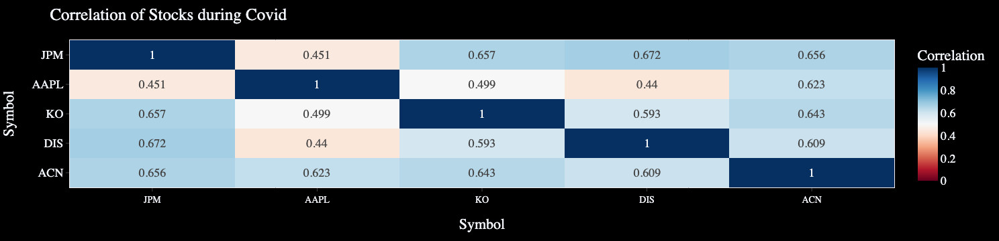

In [13]:
#Calculate and Plot Correlation of stock during covid
stocks_covid_corr = round(stocks_covid_returns.corr(), 3)

px.imshow(stocks_covid_corr, text_auto=True, aspect="auto", color_continuous_scale='RdBu', range_color=[0,1],
         labels={'x':'Symbol', 'y':'Symbol','color':'Correlation'}).update_yaxes(side="left").update_layout(title_text='Correlation of Stocks during Covid')


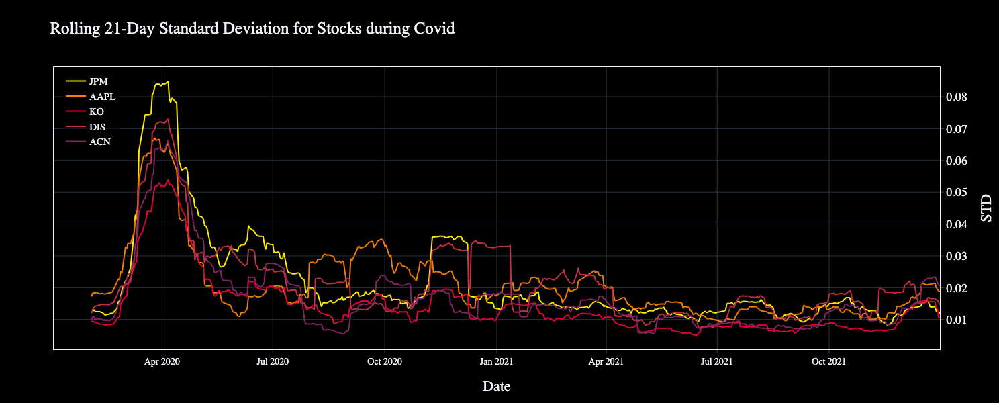

In [14]:
#Calculate Covid Standard Deviation
stocks_covid_std = stocks_covid_returns.std()*np.sqrt(252)

# Calculate Rolling standard deviation for stocks using a 21-day window
stocks_covid_roll_std = stocks_covid_returns.rolling(window=21).std()

#Plot the rolling standard deviation
px.line(stocks_covid_roll_std,
        height=600, width=1000,
        labels={'variable' : '', 'value' : 'STD', 'date' : 'Date'},
        title='Rolling 21-Day Standard Deviation for Stocks during Covid')

# Post-COVID January 1, 2022 to September 31, 2023

In [15]:
#import ticker data for Covid timeline
JPM_postcovid = openbb.stocks.load('JPM', start_date='2022-01-01', end_date='2023-09-30')
AAPL_postcovid = openbb.stocks.load('AAPL', start_date='2022-01-01', end_date='2023-09-30')
KO_postcovid = openbb.stocks.load('KO', start_date='2022-01-01', end_date='2023-09-30')
DIS_postcovid = openbb.stocks.load('DIS', start_date='2022-01-01', end_date='2023-09-30')
ACN_postcovid = openbb.stocks.load('ACN', start_date='2022-01-01', end_date='2023-09-30')

#extract adjusted close for each ticker
JPM_postcovid = JPM_postcovid['Adj Close']
AAPL_postcovid = AAPL_postcovid['Adj Close']
KO_postcovid = KO_postcovid['Adj Close']
DIS_postcovid = DIS_postcovid['Adj Close']
ACN_postcovid = ACN_postcovid['Adj Close']

#combine dataframes and rename columns
stocks_postcovid = pd.concat([JPM_postcovid, AAPL_postcovid, KO_postcovid, DIS_postcovid, ACN_postcovid], axis=1, join='inner')
stocks_postcovid = stocks_postcovid.set_axis(stock_names, axis=1)

Loading Daily data for JPM with starting period 2022-01-03.

Loading Daily data for AAPL with starting period 2022-01-03.

Loading Daily data for KO with starting period 2022-01-03.

Loading Daily data for DIS with starting period 2022-01-03.

Loading Daily data for ACN with starting period 2022-01-03.

In [16]:
# Display the highest and lowest prices for each stock
print(f"JPM High of ${round(JPM_postcovid.max(), 2)} on {stocks_postcovid.idxmax().loc['JPM'].strftime('%b %d %Y')} --- JPM Low of ${round(JPM_postcovid.min(), 2)} on {stocks_postcovid.idxmin().loc['JPM'].strftime('%b %d %Y')}") 
print(f"AAPL High of ${round(AAPL_postcovid.max(), 2)} on {stocks_postcovid.idxmax().loc['AAPL'].strftime('%b %d %Y')} --- AAPL Low of ${round(AAPL_postcovid.min(), 2)} on {stocks_postcovid.idxmin().loc['AAPL'].strftime('%b %d %Y')}") 
print(f"KO High of ${round(KO_postcovid.max(), 2)} on {stocks_postcovid.idxmax().loc['KO'].strftime('%b %d %Y')} --- KO Low of ${round(KO_postcovid.min(), 2)} on {stocks_postcovid.idxmin().loc['KO'].strftime('%b %d %Y')}") 
print(f"DIS High of ${round(DIS_postcovid.max(), 2)} on {stocks_postcovid.idxmax().loc['DIS'].strftime('%b %d %Y')} --- DIS Low of ${round(DIS_postcovid.min(), 2)} on {stocks_postcovid.idxmin().loc['DIS'].strftime('%b %d %Y')}") 
print(f"ACN High of ${round(ACN_postcovid.max(), 2)} on {stocks_postcovid.idxmax().loc['ACN'].strftime('%b %d %Y')} --- ACN Low of ${round(ACN_postcovid.min(), 2)} on {stocks_postcovid.idxmin().loc['ACN'].strftime('%b %d %Y')}") 


JPM High of $159.51 on Jan 12 2022 --- JPM Low of $99.01 on Oct 11 2022
AAPL High of $195.93 on Jul 31 2023 --- AAPL Low of $124.33 on Jan 05 2023
KO High of $62.82 on Apr 21 2022 --- KO Low of $52.36 on Oct 10 2022
DIS High of $157.38 on Jan 11 2022 --- DIS Low of $79.64 on Sep 27 2023
ACN High of $395.45 on Jan 03 2022 --- ACN Low of $243.31 on Mar 15 2023


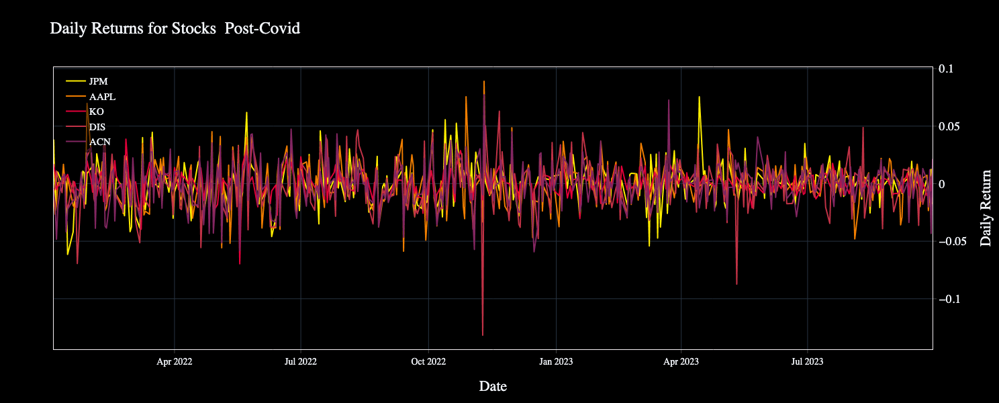

In [17]:
# Calculate daily returns Post-Covid
stocks_postcovid_returns = stocks_postcovid.pct_change()
stocks_postcovid_returns.dropna(inplace=True)

#Plot of Post-covid Daily Returns
px.line(stocks_postcovid_returns, 
        labels={'variable' : '', 'value' : 'Daily Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Daily Returns for Stocks  Post-Covid')

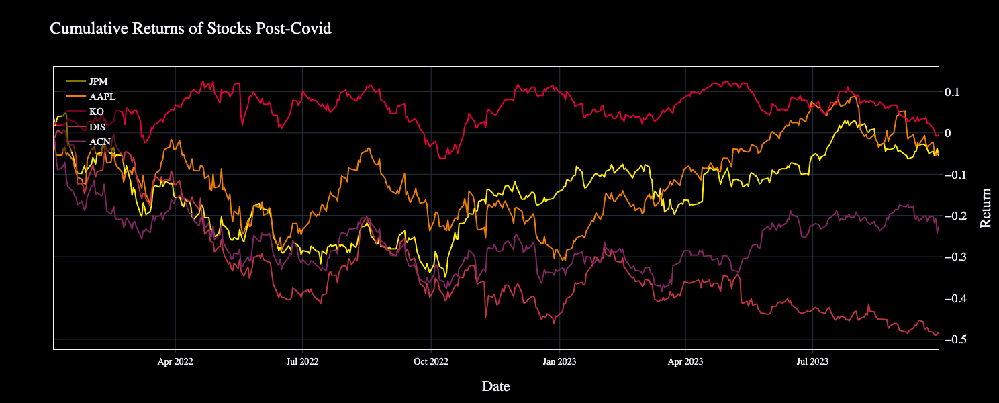

In [18]:
# Calculate and Plot cumulative returns of stocks post covidd
stocks_postcovid_cum_returns = (1 + stocks_postcovid_returns).cumprod() - 1

px.line(stocks_postcovid_cum_returns, 
        labels={'variable' : '', 'value' : 'Return', 'date' : 'Date'},
        height=600, width=1000,
        title='Cumulative Returns of Stocks Post-Covid')

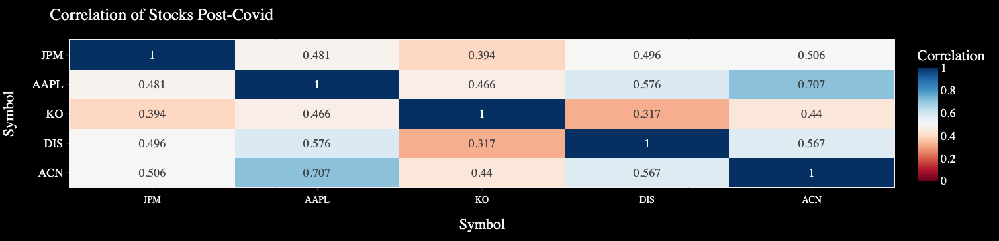

In [19]:
#Calculate and Plot Correlation of stock post covid
stocks_postcovid_corr = round(stocks_postcovid_returns.corr(), 3)

px.imshow(stocks_postcovid_corr, text_auto=True, aspect="auto", color_continuous_scale='RdBu', range_color=[0,1],
          labels={'x':'Symbol', 'y':'Symbol','color':'Correlation'}).update_yaxes(side="left").update_layout(title_text='Correlation of Stocks Post-Covid')


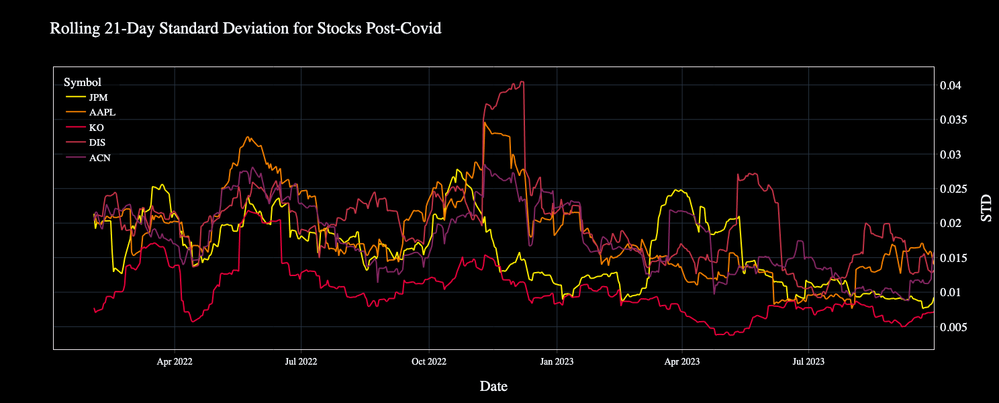

In [20]:
#Calculate Post Covid Standard Deviation
stocks_postcovid_std = stocks_postcovid_returns.std()*np.sqrt(252)

# Calculate Rolling standard deviation for stocks using a 21-day window
stocks_postcovid_roll_std = stocks_postcovid_returns.rolling(window=21).std()

# Plot the rolling standard deviation
px.line(stocks_postcovid_roll_std,
        height=600, width=1000,
        labels={'variable' : 'Symbol', 'value' : 'STD', 'date' : 'Date'},
        title='Rolling 21-Day Standard Deviation for Stocks Post-Covid')

### Monte Carlo Simulation

In [21]:
#import data in accecptable format
#Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version = "v2"
)


# Set timeframe to "1Day"
timeframe = "1Day"

# Set start and end datetimes
start_date = pd.Timestamp("2022-01-01", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2023-09-30", tz="America/New_York").isoformat()


stocks_import = api.get_bars(
    stock_names,
    timeframe,
    start=start_date,
    end=end_date,
    limit=10000
).df

# Reorganize the DataFrame & Separate ticker data
JPM = stocks_import[stocks_import["symbol"]=="JPM"].drop("symbol", axis=1)
AAPL = stocks_import[stocks_import["symbol"]=="AAPL"].drop("symbol", axis=1)
KO = stocks_import[stocks_import["symbol"]=="KO"].drop("symbol", axis=1)
DIS = stocks_import[stocks_import["symbol"]=="DIS"].drop("symbol", axis=1)
ACN = stocks_import[stocks_import["symbol"]=="ACN"].drop("symbol", axis=1)

#Clean Dataframe
stocks_post =pd.concat([JPM, AAPL, KO, DIS, ACN], axis=1, keys=stock_names)

JPM                                           \
                            close      high       low trade_count     open   
timestamp                                                                    
2022-01-03 05:00:00+00:00  161.70  162.6400  159.5100      129159  159.860   
2022-01-04 05:00:00+00:00  167.83  168.5800  164.2300      197828  164.310   
2022-01-05 05:00:00+00:00  163.78  168.3589  163.7300      153068  167.820   
2022-01-06 05:00:00+00:00  165.52  167.3700  163.8700      131983  166.910   
2022-01-07 05:00:00+00:00  167.16  167.5300  165.0600      129351  165.665   
...                           ...       ...       ...         ...      ...   
2023-09-25 04:00:00+00:00  146.45  146.5200  143.7000       93310  145.350   
2023-09-26 04:00:00+00:00  144.93  145.8400  144.2300       95020  144.600   
2023-09-27 04:00:00+00:00  145.78  146.0900  144.5115       93086  145.190   
2023-09-28 04:00:00+00:00  147.59  148.8700  146.0100      113520  146.280   
2023-09-29 04:00:00+00:00  145.02  148.7600  144.8600      117427  148.600   

                                                   AAPL                   ...  \
                             volume        vwap   close    high      low  ...   
timestamp                                                                 ...   
2022-01-03 05:00:00+00:00  14966571  161.520007  182.01  182.88  177.710  ...   
2022-01-04 05:00:00+00:00  22485046  167.406121  179.70  182.94  179.120  ...   
2022-01-05 05:00:00+00:00  20295694  165.394146  174.92  180.17  174.640  ...   
2022-01-06 05:00:00+00:00  17076363  165.213314  172.00  175.30  171.640  ...   
2022-01-07 05:00:00+00:00  15958262  166.688608  172.17  174.14  171.030  ...   
...                             ...         ...     ...     ...      ...  ...   
2023-09-25 04:00:00+00:00   7044672  145.433605  176.08  176.97  174.150  ...   
2023-09-26 04:00:00+00:00   7468405  144.981703  171.96  175.20  171.660  ...   
2023-09-27 04:00:00+00:00   6717854  145.472104  170.43  173.04  169.050  ...   
2023-09-28 04:00:00+00:00   8868064  147.708557  170.69  172.03  167.620  ...   
2023-09-29 04:00:00+00:00  11925422  145.881337  171.21  173.07  170.341  ...   

                              DIS                           ACN           \
                             open    volume        vwap   close     high   
timestamp                                                                  
2022-01-03 05:00:00+00:00  155.83  11631085  156.517043  407.21  415.530   
2022-01-04 05:00:00+00:00  158.59  18120285  157.118813  404.30  411.370   
2022-01-05 05:00:00+00:00  156.52  13419263  156.968122  397.18  403.970   
2022-01-06 05:00:00+00:00  156.24  12401694  156.528811  378.00  392.195   
2022-01-07 05:00:00+00:00  156.90  11467125  157.996902  370.75  379.990   
...                           ...       ...         ...     ...      ...   
2023-09-25 04:00:00+00:00   81.56  11034440   80.967822  316.99  318.680   
2023-09-26 04:00:00+00:00   80.50  14867864   80.205077  310.61  314.490   
2023-09-27 04:00:00+00:00   80.12  14662723   79.810612  314.38  314.980   
2023-09-28 04:00:00+00:00   80.28  12229820   80.117450  300.77  306.690   
2023-09-29 04:00:00+00:00   80.66  11262705   80.832928  307.11  309.300   

                                                                            
                              low trade_count    open   volume        vwap  
timestamp                                                                   
2022-01-03 05:00:00+00:00  405.04       39798  414.66  2463982  407.888010  
2022-01-04 05:00:00+00:00  403.20       51186  408.81  2780553  406.375406  
2022-01-05 05:00:00+00:00  397.10       48223  403.93  2822765  399.339362  
2022-01-06 05:00:00+00:00  375.76       78836  384.69  4773224  381.297216  
2022-01-07 05:00:00+00:00  370.14       55509  379.09  3911080  373.426002  
...                           ...         ...     ...      ...         ...  
2023-09-25 04:00:00+00:00  314.88       4379

In [22]:
#varaibles to be used in the simulation
num_sims = 100
trading_days = 252*10


#Set the parameters for post covid simulation
mc_stocks = MCSimulation(
    portfolio_data = stocks_post,
    num_simulation = num_sims,
    num_trading_days = trading_days)

In [23]:
#Run cumulative return simulation
mc_stocks.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007811,1.000124,0.994335,0.991265,1.004828,0.991215,0.999230,0.997158,1.009452,1.000611,...,1.004402,0.988123,0.998608,1.004899,0.999398,1.016559,0.996968,0.993225,1.001258,0.998916
2,1.007277,0.990753,0.990955,0.987708,1.001018,0.992058,0.997625,1.005755,1.009342,1.003085,...,0.995205,0.975079,0.998118,1.016926,0.996564,1.011034,0.995666,0.973900,0.985840,0.993737
3,1.009390,0.984007,0.985623,0.988162,1.007382,0.999700,0.994362,1.005006,0.996319,1.009301,...,0.992554,0.972339,1.000029,1.016666,0.991654,1.015318,1.000428,0.968440,0.990727,0.992609
4,1.027628,0.983709,0.991021,0.987123,1.004763,0.993648,0.991724,0.991669,0.996806,1.016064,...,1.004143,0.970376,0.984172,1.008176,0.999414,1.009865,0.989737,0.970711,0.984866,0.996127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2516,0.278607,0.251837,0.347147,0.256777,0.419787,0.530297,0.194159,0.652656,0.614833,0.407454,...,0.326230,0.461672,0.251026,0.669452,0.843411,0.611480,0.389826,0.414370,0.425704,0.551980
2517,0.275927,0.251776,0.346958,0.255529,0.417312,0.527609,0.199024,0.653551,0.619923,0.408180,...,0.326324,0.462740,0.251016,0.681101,0.852418,0.607968,0.391766,0.413388,0.420845,0.548629
2518,0.271948,0.253860,0.344328,0.255679,0.414078,0.534585,0.197622,0.649158,0.616507,0.403314,...,0.326260,0.467476,0.250085,0.674876,0.836035,0.612702,0.395420,0.412229,0.419678,0.552346
2519,0.271471,0.257543,0.347877,0.255841,0.412724,0.531820,0.198641,0.660926,0.611039,0.403745,...,0.330110,0.466220,0.249560,0.672981,0.835750,0.613776,0.399643,0.415498,0.418929,0.548492


In [27]:
# Getting the summary of the monte carlo simulation
stocks_10y_stats = mc_stocks.summarize_cumulative_return()
print(stocks_10y_stats)

count           100.000000
mean              0.384830
std               0.143233
min               0.138379
25%               0.277825
50%               0.367654
75%               0.445115
max               0.837539
95% CI Lower      0.199057
95% CI Upper      0.807684
Name: 2520, dtype: float64


In [ ]:
# Set initial investment 
# Including an input statement to give more options in initial investment. 
initial_investment_10y = int(input('What would you like your initial investment to be?(Please use whole numbers.)'))
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our initial investment
ci_lower_10y = round(stocks_10y_stats[8]*initial_investment_10y,2)
ci_upper_10y = round(stocks_10y_stats[9]*initial_investment_10y,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment_10y} in the portfolio"
      f" over the next 10 years will end within in the range of"
      f" ${ci_lower_10y} and ${ci_upper_10y}")